In [10]:
import sys

In [11]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import seaborn as sns
from scipy.stats import shapiro
from sklearn.preprocessing import QuantileTransformer, StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

In [12]:
# Display settings
pd.set_option('display.max_columns', None)
sns.set(style="whitegrid")

In [13]:
# Load datasets
input_train_filepath = sys.argv[1]
traffic_df = pd.read_csv("..\Traffic_analysis\Traffic.csv")
traffic_two_month_df = pd.read_csv("..\Traffic_analysis\TrafficTwoMonth.csv")

In [14]:
traffic_df.head(10)

,Time,Date,Day of the week,CarCount,BikeCount,BusCount,TruckCount,Total,Traffic Situation
0,12:00:00 AM,10,Tuesday,31,0,4,4,39,low
1,12:15:00 AM,10,Tuesday,49,0,3,3,55,low
2,12:30:00 AM,10,Tuesday,46,0,3,6,55,low
3,12:45:00 AM,10,Tuesday,51,0,2,5,58,low
4,1:00:00 AM,10,Tuesday,57,6,15,16,94,normal
5,1:15:00 AM,10,Tuesday,44,0,5,4,53,low
6,1:30:00 AM,10,Tuesday,37,0,1,4,42,low
7,1:45:00 AM,10,Tuesday,42,4,4,5,55,low
8,2:00:00 AM,10,Tuesday,51,0,9,7,67,low
9,2:15:00 AM,10,Tuesday,34,0,4,7,45,low


In [15]:
traffic_two_month_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5952 entries, 0 to 5951
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Time               5952 non-null   object
 1   Date               5952 non-null   int64 
 2   Day of the week    5952 non-null   object
 3   CarCount           5952 non-null   int64 
 4   BikeCount          5952 non-null   int64 
 5   BusCount           5952 non-null   int64 
 6   TruckCount         5952 non-null   int64 
 7   Total              5952 non-null   int64 
 8   Traffic Situation  5952 non-null   object
dtypes: int64(6), object(3)
memory usage: 418.6+ KB


In [16]:
traffic_two_month_df.describe()

,Date,CarCount,BikeCount,BusCount,TruckCount,Total
count,5952.000000,5952.000000,5952.000000,5952.000000,5952.000000,5952.000000
mean,16.000000,65.440692,12.161458,12.912970,18.646337,109.161458
std,8.945023,44.749335,11.537944,12.497736,10.973139,55.996312
min,1.000000,5.000000,0.000000,0.000000,0.000000,21.000000
25%,8.000000,18.750000,3.000000,2.000000,10.000000,54.000000
50%,16.000000,62.000000,9.000000,10.000000,18.000000,104.000000
75%,24.000000,103.000000,19.000000,20.000000,27.000000,153.000000
max,31.000000,180.000000,70.000000,50.000000,60.000000,279.000000


In [17]:
traffic_two_month_df.head(10)

,Time,Date,Day of the week,CarCount,BikeCount,BusCount,TruckCount,Total,Traffic Situation
0,12:00:00 AM,10,Tuesday,13,2,2,24,41,normal
1,12:15:00 AM,10,Tuesday,14,1,1,36,52,normal
2,12:30:00 AM,10,Tuesday,10,2,2,32,46,normal
3,12:45:00 AM,10,Tuesday,10,2,2,36,50,normal
4,1:00:00 AM,10,Tuesday,11,2,1,34,48,normal
5,1:15:00 AM,10,Tuesday,15,1,1,39,56,normal
6,1:30:00 AM,10,Tuesday,14,2,2,27,45,normal
7,1:45:00 AM,10,Tuesday,13,2,1,20,36,normal
8,2:00:00 AM,10,Tuesday,7,0,0,26,33,normal
9,2:15:00 AM,10,Tuesday,13,0,0,34,47,normal


In [18]:
traffic_df['Traffic Situation'].value_counts()

Traffic Situation
normal    1669
heavy      682
high       321
low        304
Name: count, dtype: int64

In [19]:
# Combine datasets
traffic_df['Source'] = 'OneMonth'
traffic_two_month_df['Source'] = 'TwoMonth'
combined_df = pd.concat([traffic_df, traffic_two_month_df], ignore_index=True)

In [20]:
combined_df.describe()

,Date,CarCount,BikeCount,BusCount,TruckCount,Total
count,8928.000000,8928.000000,8928.000000,8928.000000,8928.000000,8928.000000
mean,16.000000,66.525986,13.080085,13.701837,17.539203,110.847110
std,8.944773,45.142975,12.059836,13.187748,10.963233,57.474554
min,1.000000,5.000000,0.000000,0.000000,0.000000,21.000000
25%,8.000000,19.000000,4.000000,1.000000,9.000000,55.000000
50%,16.000000,63.000000,10.000000,11.000000,16.000000,105.000000
75%,24.000000,104.000000,20.000000,22.000000,26.000000,157.000000
max,31.000000,180.000000,70.000000,50.000000,60.000000,279.000000


In [21]:
# 1. Distribution of vehicle counts for cars, bikes, buses, and trucks
fig = make_subplots(rows=2, cols=2, subplot_titles=("Car Counts", "Bike Counts", "Bus Counts", "Truck Counts"))

fig.add_trace(go.Histogram(x=combined_df['CarCount'], name='Car Counts', marker_color='#1f77b4'), row=1, col=1)
fig.add_trace(go.Histogram(x=combined_df['BikeCount'], name='Bike Counts', marker_color='#ff7f0e'), row=1, col=2)
fig.add_trace(go.Histogram(x=combined_df['BusCount'], name='Bus Counts', marker_color='#2ca02c'), row=2, col=1)
fig.add_trace(go.Histogram(x=combined_df['TruckCount'], name='Truck Counts', marker_color='#d62728'), row=2, col=2)

fig.update_layout(title_text='Distribution of Vehicle Counts', title_x=0.5, showlegend=False, template='plotly_white')
fig.update_xaxes(title_text="Count")
fig.update_yaxes(title_text="Frequency")
fig.show()

In [22]:
# 3. Distribution of traffic situations
fig = px.pie(combined_df, names='Traffic Situation', title='Traffic Situation Distribution', color_discrete_sequence=px.colors.sequential.RdBu)
fig.update_layout(title_text='Traffic Situation Distribution', title_x=0.5, template='plotly_white')
fig.show()

In [23]:
combined_df.head()

,Time,Date,Day of the week,CarCount,BikeCount,BusCount,TruckCount,Total,Traffic Situation,Source
0,12:00:00 AM,10,Tuesday,31,0,4,4,39,low,OneMonth
1,12:15:00 AM,10,Tuesday,49,0,3,3,55,low,OneMonth
2,12:30:00 AM,10,Tuesday,46,0,3,6,55,low,OneMonth
3,12:45:00 AM,10,Tuesday,51,0,2,5,58,low,OneMonth
4,1:00:00 AM,10,Tuesday,57,6,15,16,94,normal,OneMonth


In [24]:
from flask import Flask, jsonify
def get_vehicle_counts():


    # 从数据中提取和聚合信息
    vehicle_counts = {
        'Traffic Situation': combined_df['Traffic Situation'].unique().tolist(),
        'CarCount': combined_df.groupby('Traffic Situation')['CarCount'].sum().tolist(),
        'BikeCount': combined_df.groupby('Traffic Situation')['BikeCount'].sum().tolist(),
        'BusCount': combined_df.groupby('Traffic Situation')['BusCount'].sum().tolist(),
        'TruckCount': combined_df.groupby('Traffic Situation')['TruckCount'].sum().tolist(),
    }

    return vehicle_counts



In [25]:
get_vehicle_counts()

{'Traffic Situation': ['low', 'normal', 'heavy', 'high'],
 'CarCount': [237839, 56311, 50095, 249699],
 'BikeCount': [50610, 10079, 9945, 46145],
 'BusCount': [54950, 15827, 5356, 46197],
 'TruckCount': [12837, 15299, 12126, 116328]}

In [26]:
# 4. Vehicle count vary by day of the week
fig = make_subplots(rows=2, cols=2, subplot_titles=("Car Counts by Day", "Bike Counts by Day", "Bus Counts by Day", "Truck Counts by Day"))

fig.add_trace(go.Box(x=combined_df['Day of the week'], y=combined_df['CarCount'], name='Car Counts', marker_color='#1f77b4'), row=1, col=1)
fig.add_trace(go.Box(x=combined_df['Day of the week'], y=combined_df['BikeCount'], name='Bike Counts', marker_color='#ff7f0e'), row=1, col=2)
fig.add_trace(go.Box(x=combined_df['Day of the week'], y=combined_df['BusCount'], name='Bus Counts', marker_color='#2ca02c'), row=2, col=1)
fig.add_trace(go.Box(x=combined_df['Day of the week'], y=combined_df['TruckCount'], name='Truck Counts', marker_color='#d62728'), row=2, col=2)

fig.update_layout(title_text='Vehicle Counts by Day of the Week', title_x=0.5, showlegend=False, template='plotly_white')
fig.update_xaxes(title_text="Day of the Week")
fig.update_yaxes(title_text="Count")
fig.show()

In [27]:
# 5-8. Relationship between vehicle counts and traffic situation
fig = make_subplots(rows=2, cols=2, subplot_titles=("Car Counts by Traffic Situation", "Bike Counts by Traffic Situation", "Bus Counts by Traffic Situation", "Truck Counts by Traffic Situation"))

fig.add_trace(go.Box(x=combined_df['Traffic Situation'], y=combined_df['CarCount'], name='Car Counts', marker_color='#1f77b4'), row=1, col=1)
fig.add_trace(go.Box(x=combined_df['Traffic Situation'], y=combined_df['BikeCount'], name='Bike Counts', marker_color='#ff7f0e'), row=1, col=2)
fig.add_trace(go.Box(x=combined_df['Traffic Situation'], y=combined_df['BusCount'], name='Bus Counts', marker_color='#2ca02c'), row=2, col=1)
fig.add_trace(go.Box(x=combined_df['Traffic Situation'], y=combined_df['TruckCount'], name='Truck Counts', marker_color='#d62728'), row=2, col=2)

fig.update_layout(title_text='Vehicle Counts by Traffic Situation', title_x=0.5, showlegend=False, template='plotly_white')
fig.update_xaxes(title_text="Traffic Situation")
fig.update_yaxes(title_text="Count")
fig.show()

In [28]:
# 9. Total vehicle count by traffic situation
fig = px.box(combined_df, x='Traffic Situation', y='Total', title='Total Vehicle Count by Traffic Situation', color_discrete_sequence=px.colors.sequential.RdBu)
fig.update_layout(title_text='Total Vehicle Count by Traffic Situation', title_x=0.5, xaxis_title='Traffic Situation', yaxis_title='Total Count', template='plotly_white')
fig.show()

In [29]:
# 10. Vehicle count vary by source
fig = make_subplots(rows=2, cols=2, subplot_titles=("Car Counts by Source", "Bike Counts by Source", "Bus Counts by Source", "Truck Counts by Source"))

fig.add_trace(go.Box(x=combined_df['Source'], y=combined_df['CarCount'], name='Car Counts', marker_color='#1f77b4'), row=1, col=1)
fig.add_trace(go.Box(x=combined_df['Source'], y=combined_df['BikeCount'], name='Bike Counts', marker_color='#ff7f0e'), row=1, col=2)
fig.add_trace(go.Box(x=combined_df['Source'], y=combined_df['BusCount'], name='Bus Counts', marker_color='#2ca02c'), row=2, col=1)
fig.add_trace(go.Box(x=combined_df['Source'], y=combined_df['TruckCount'], name='Truck Counts', marker_color='#d62728'), row=2, col=2)

fig.update_layout(title_text='Vehicle Counts by Source', title_x=0.5, showlegend=False, template='plotly_white')
fig.update_xaxes(title_text="Source")
fig.update_yaxes(title_text="Count")
fig.show()

In [30]:
# 11. Busiest hours of the day for traffic
combined_df['Hour'] = pd.to_datetime(combined_df['Time'], format='%I:%M:%S %p').dt.hour
fig = px.box(combined_df, x='Hour', y='Total', title='Total Vehicle Count by Hour', color_discrete_sequence=['#9467bd'])
fig.update_layout(title_text='Total Vehicle Count by Hour', title_x=0.5, xaxis_title='Hour', yaxis_title='Total Count', template='plotly_white')
fig.show()

In [31]:
# 12. Traffic situation distribution by day of the week
fig = px.box(combined_df, x='Day of the week', y='Traffic Situation', title='Traffic Situation by Day of the Week', color_discrete_sequence=px.colors.sequential.RdBu)
fig.update_layout(title_text='Traffic Situation by Day of the Week', title_x=0.5, xaxis_title='Day of the Week', yaxis_title='Traffic Situation', template='plotly_white')
fig.show()

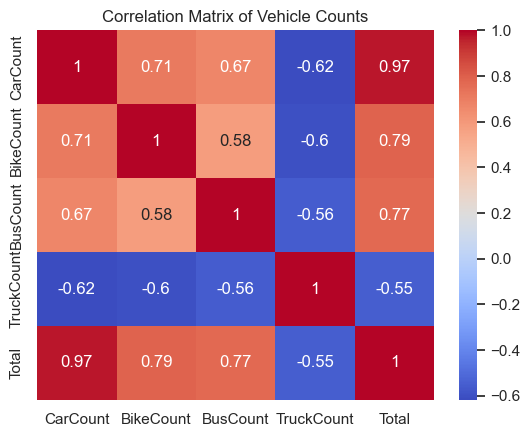

In [32]:
# 13. Correlations between different vehicle types
corr_matrix = combined_df[['CarCount', 'BikeCount', 'BusCount', 'TruckCount', 'Total']].corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix of Vehicle Counts')
plt.show()

In [33]:
# 16. Distribution of vehicle counts between weekdays and weekends
combined_df['Weekend'] = combined_df['Day of the week'].isin(['Saturday', 'Sunday'])
fig = make_subplots(rows=2, cols=2, subplot_titles=("Car Counts by Weekend", "Bike Counts by Weekend", "Bus Counts by Weekend", "Truck Counts by Weekend"))

fig.add_trace(go.Box(x=combined_df['Weekend'], y=combined_df['CarCount'], name='Car Counts', marker_color='#1f77b4'), row=1, col=1)
fig.add_trace(go.Box(x=combined_df['Weekend'], y=combined_df['BikeCount'], name='Bike Counts', marker_color='#ff7f0e'), row=1, col=2)
fig.add_trace(go.Box(x=combined_df['Weekend'], y=combined_df['BusCount'], name='Bus Counts', marker_color='#2ca02c'), row=2, col=1)
fig.add_trace(go.Box(x=combined_df['Weekend'], y=combined_df['TruckCount'], name='Truck Counts', marker_color='#d62728'), row=2, col=2)

fig.update_layout(title_text='Vehicle Counts by Weekend', title_x=0.5, showlegend=False, template='plotly_white')
fig.update_xaxes(title_text="Weekend")
fig.update_yaxes(title_text="Count")
fig.show()

In [34]:
# 18. Distribution of traffic situations by hour
fig = px.box(combined_df, x='Hour', y='Traffic Situation', title='Traffic Situation by Hour', color_discrete_sequence=px.colors.sequential.RdBu)
fig.update_layout(title_text='Traffic Situation by Hour', title_x=0.5, xaxis_title='Hour', yaxis_title='Traffic Situation', template='plotly_white')
fig.show()

In [35]:
# Calculate average total vehicle count for each source
combined_df['Traffic Situation'] = combined_df['Traffic Situation'].astype('category').cat.codes
avg_source_counts = combined_df.groupby('Source').mean(numeric_only=True).reset_index()
fig = px.bar(avg_source_counts, x='Source', y='Total', title='Average Total Vehicle Count by Source', color_discrete_sequence=['#1f77b4'])
fig.update_layout(title_text='Average Total Vehicle Count by Source', title_x=0.5, xaxis_title='Source', yaxis_title='Average Total Count', template='plotly_white')
fig.show()

In [36]:
# 20. Distribution of total vehicle counts for each day of the week
fig = px.box(combined_df, x='Day of the week', y='Total', title='Total Vehicle Count by Day of the Week', color_discrete_sequence=['#9467bd'])
fig.update_layout(title_text='Total Vehicle Count by Day of the Week', title_x=0.5, xaxis_title='Day of the Week', yaxis_title='Total Count', template='plotly_white')
fig.show()

In [37]:
# 22. Variance in vehicle counts across vehicle types
variance_df = combined_df[['CarCount', 'BikeCount', 'BusCount', 'TruckCount']].var().reset_index()
variance_df.columns = ['Vehicle Type', 'Variance']
fig = px.bar(variance_df, x='Vehicle Type', y='Variance', title='Variance in Vehicle Counts', color_discrete_sequence=['#ff7f0e'])
fig.update_layout(title_text='Variance in Vehicle Counts', title_x=0.5, xaxis_title='Vehicle Type', yaxis_title='Variance', template='plotly_white')
fig.show()

In [38]:
# 23. Distribution of vehicle counts by source and day of the week
fig = make_subplots(rows=2, cols=2, subplot_titles=("Car Counts by Source and Day", "Bike Counts by Source and Day", "Bus Counts by Source and Day", "Truck Counts by Source and Day"))

fig.add_trace(go.Box(x=combined_df['Day of the week'], y=combined_df['CarCount'], name='Car Counts', marker_color='#1f77b4'), row=1, col=1)
fig.add_trace(go.Box(x=combined_df['Day of the week'], y=combined_df['BikeCount'], name='Bike Counts', marker_color='#ff7f0e'), row=1, col=2)
fig.add_trace(go.Box(x=combined_df['Day of the week'], y=combined_df['BusCount'], name='Bus Counts', marker_color='#2ca02c'), row=2, col=1)
fig.add_trace(go.Box(x=combined_df['Day of the week'], y=combined_df['TruckCount'], name='Truck Counts', marker_color='#d62728'), row=2, col=2)

fig.update_layout(title_text='Distribution of Vehicle Counts by Source and Day of the Week', title_x=0.5, showlegend=False, template='plotly_white')
fig.show()


#查看异常数据

In [39]:
# 25. Peak traffic hours for each vehicle type
fig = make_subplots(rows=2, cols=2, subplot_titles=("Car Counts by Hour", "Bike Counts by Hour", "Bus Counts by Hour", "Truck Counts by Hour"))

fig.add_trace(go.Box(x=combined_df['Hour'], y=combined_df['CarCount'], name='Car Counts', marker_color='#1f77b4'), row=1, col=1)
fig.add_trace(go.Box(x=combined_df['Hour'], y=combined_df['BikeCount'], name='Bike Counts', marker_color='#ff7f0e'), row=1, col=2)
fig.add_trace(go.Box(x=combined_df['Hour'], y=combined_df['BusCount'], name='Bus Counts', marker_color='#2ca02c'), row=2, col=1)
fig.add_trace(go.Box(x=combined_df['Hour'], y=combined_df['TruckCount'], name='Truck Counts', marker_color='#d62728'), row=2, col=2)

fig.update_layout(title_text='Vehicle Counts by Hour', title_x=0.5, showlegend=False, template='plotly_white')
fig.update_xaxes(title_text="Hour")
fig.update_yaxes(title_text="Count")
fig.show()

In [40]:
# # 26. Average vehicle count for each type change over time
# # Exclude non-numeric columns from the mean calculation
# numeric_cols = combined_df.select_dtypes(include=['number']).columns

# # Group by 'Time' and calculate the mean for numeric columns
# avg_time_counts = combined_df.groupby('Time')[numeric_cols].mean().reset_index()

# # Create the line plot
# fig = px.line(avg_time_counts, x='Time', y=['CarCount', 'BikeCount', 'BusCount', 'TruckCount'], title='Average Vehicle Counts Over Time')
# fig.update_layout(title_text='Average Vehicle Counts Over Time', title_x=0.5, xaxis_title='Time', yaxis_title='Average Count', template='plotly_white')

# # Display the plot
# fig.show()

In [41]:
# 29. Distribution of traffic situations by date
fig = px.box(combined_df, x='Date', y='Traffic Situation', title='Traffic Situation by Date', color_discrete_sequence=px.colors.sequential.RdBu)
fig.update_layout(title_text='Traffic Situation by Date', title_x=0.5, xaxis_title='Date', yaxis_title='Traffic Situation', template='plotly_white')
fig.show()

### 删除异常数据
这个函数使用四分位数法（IQR）来确定异常值，并从数据集中删除它们。该方法对数值列特别有效。

In [42]:
# Identify and remove outliers
def remove_outliers(df, columns):
    for col in columns:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        df = df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]
    return df

vehicle_counts = ['CarCount', 'BikeCount', 'BusCount', 'TruckCount']
combined_df = remove_outliers(combined_df, vehicle_counts)

In [43]:
combined_df.describe()

,Date,CarCount,BikeCount,BusCount,TruckCount,Total,Traffic Situation,Hour
count,8720.000000,8720.000000,8720.000000,8720.000000,8720.000000,8720.000000,8720.000000,8720.000000
mean,15.994954,64.661239,12.136468,13.619151,17.786927,108.203784,2.152638,11.504472
std,8.947053,43.699016,10.224959,13.284608,10.708121,55.200560,1.186084,6.995155
min,1.000000,5.000000,0.000000,0.000000,0.000000,21.000000,0.000000,0.000000
25%,8.000000,19.000000,3.000000,1.000000,9.000000,54.000000,1.000000,5.000000
50%,16.000000,61.000000,10.000000,10.000000,17.000000,104.000000,3.000000,11.000000
75%,24.000000,103.000000,19.000000,22.000000,26.000000,152.250000,3.000000,18.000000
max,31.000000,179.000000,44.000000,50.000000,54.000000,247.000000,3.000000,23.000000


In [44]:
# Check for missing values and duplicates
print("Missing values in each column:")
print(combined_df.isnull().sum())

print(f"Number of duplicate rows: {combined_df.duplicated().sum()}")

Missing values in each column:
Time                 0
Date                 0
Day of the week      0
CarCount             0
BikeCount            0
BusCount             0
TruckCount           0
Total                0
Traffic Situation    0
Source               0
Hour                 0
Weekend              0
dtype: int64
Number of duplicate rows: 0


In [45]:
# # Plot boxplots to visualize outliers
# fig, axes = plt.subplots(2, 2, figsize=(15, 10))
# sns.boxplot(data=combined_df, x='CarCount', ax=axes[0, 0], color='#1f77b4')
# sns.boxplot(data=combined_df, x='BikeCount', ax=axes[0, 1], color='#ff7f0e')
# sns.boxplot(data=combined_df, x='BusCount', ax=axes[1, 0], color='#2ca02c')
# sns.boxplot(data=combined_df, x='TruckCount', ax=axes[1, 1], color='#d62728')
# axes[0, 0].set_title('Car Count')
# axes[0, 1].set_title('Bike Count')
# axes[1, 0].set_title('Bus Count')
# axes[1, 1].set_title('Truck Count')
# plt.tight_layout()
# plt.show()

In [46]:
# Check normality for each vehicle count before normalization
def check_normality(data):
    stat, p = shapiro(data)
    return p > 0.05

print("Normality check before normalization:")
car_normal = check_normality(combined_df['CarCount'])
bike_normal = check_normality(combined_df['BikeCount'])
bus_normal = check_normality(combined_df['BusCount'])
truck_normal = check_normality(combined_df['TruckCount'])

print(f"Car count normality: {car_normal}")
print(f"Bike count normality: {bike_normal}")
print(f"Bus count normality: {bus_normal}")
print(f"Truck count normality: {truck_normal}")

# Normalize data using QuantileTransformer
scaler = QuantileTransformer(output_distribution='normal')
combined_df[['CarCount', 'BikeCount', 'BusCount', 'TruckCount']] = scaler.fit_transform(combined_df[['CarCount', 'BikeCount', 'BusCount', 'TruckCount']])

# Check normality for each vehicle count after normalization
print("Normality check after normalization:")
car_normal = check_normality(combined_df['CarCount'])
bike_normal = check_normality(combined_df['BikeCount'])
bus_normal = check_normality(combined_df['BusCount'])
truck_normal = check_normality(combined_df['TruckCount'])

print(f"Car count normality: {car_normal}")
print(f"Bike count normality: {bike_normal}")
print(f"Bus count normality: {bus_normal}")
print(f"Truck count normality: {truck_normal}")

Normality check before normalization:
Car count normality: False
Bike count normality: False
Bus count normality: False
Truck count normality: False
Normality check after normalization:
Car count normality: False
Bike count normality: False
Bus count normality: False
Truck count normality: False


d:\tool\anaconda3\lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning:

p-value may not be accurate for N > 5000.

d:\tool\anaconda3\lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning:

p-value may not be accurate for N > 5000.



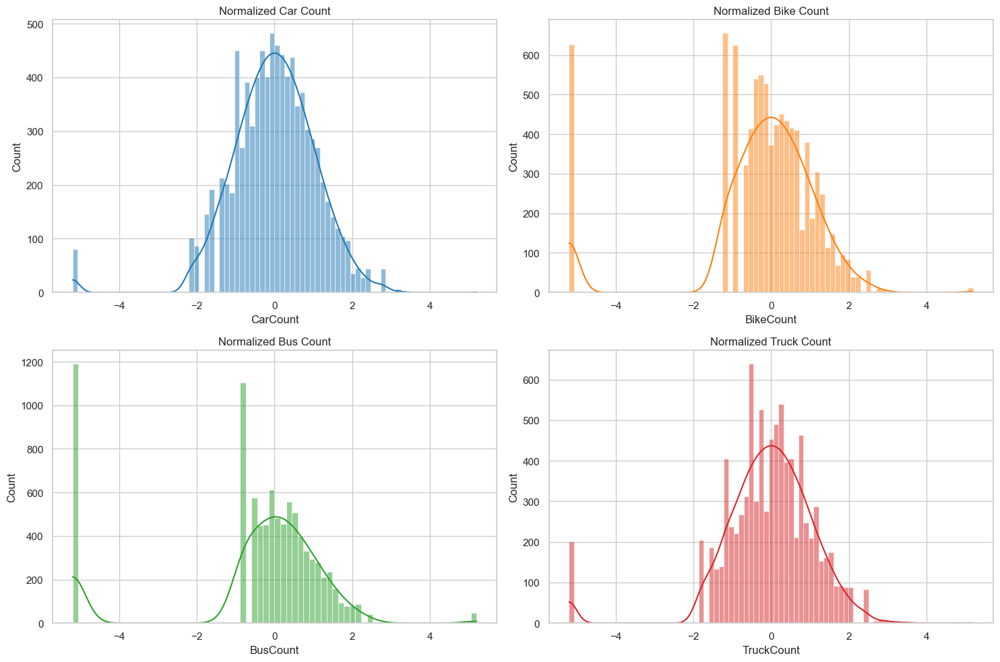

In [47]:
# Check distribution after normalization
fig, axes = plt.subplots(2, 2, figsize=(15, 10))
sns.histplot(combined_df['CarCount'], ax=axes[0, 0], kde=True, color='#1f77b4')
sns.histplot(combined_df['BikeCount'], ax=axes[0, 1], kde=True, color='#ff7f0e')
sns.histplot(combined_df['BusCount'], ax=axes[1, 0], kde=True, color='#2ca02c')
sns.histplot(combined_df['TruckCount'], ax=axes[1, 1], kde=True, color='#d62728')
axes[0, 0].set_title('Normalized Car Count')
axes[0, 1].set_title('Normalized Bike Count')
axes[1, 0].set_title('Normalized Bus Count')
axes[1, 1].set_title('Normalized Truck Count')
plt.tight_layout()
plt.show()

In [48]:
# Prepare the features and target
X = combined_df.drop(columns=['Traffic Situation'])
y = combined_df['Traffic Situation']

In [49]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [50]:
# Preprocessing pipeline for numeric and categorical features
numeric_features = ['CarCount', 'BikeCount', 'BusCount', 'TruckCount', 'Total', 'Hour']
categorical_features = ['Time', 'Date', 'Day of the week', 'Source', 'Weekend']

preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_features),
        ('cat', OneHotEncoder(), categorical_features)
    ])

In [51]:
# Define the model pipeline
model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', RandomForestClassifier(random_state=42))
])

# Train the model
model.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num', StandardScaler(),
                                                  ['CarCount', 'BikeCount',
                                                   'BusCount', 'TruckCount',
                                                   'Total', 'Hour']),
                                                 ('cat', OneHotEncoder(),
                                                  ['Time', 'Date',
                                                   'Day of the week', 'Source',
                                                   'Weekend'])])),
                ('classifier', RandomForestClassifier(random_state=42))])

In [52]:
# Make predictions
y_pred = model.predict(X_test)

In [53]:
# Evaluate the model
print("Model Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:")
print(classification_report(y_test, y_pred))

Model Accuracy: 0.9902522935779816
Classification Report:
              precision    recall  f1-score   support

           0       0.99      1.00      1.00       333
           1       0.98      1.00      0.99       122
           2       0.98      0.97      0.97       238
           3       0.99      0.99      0.99      1051

    accuracy                           0.99      1744
   macro avg       0.99      0.99      0.99      1744
weighted avg       0.99      0.99      0.99      1744



In [54]:
# Inverse transform the normalized values to their original scale
inverse_transformed_data = scaler.inverse_transform(combined_df[['CarCount', 'BikeCount', 'BusCount', 'TruckCount']])
combined_df[['CarCount', 'BikeCount', 'BusCount', 'TruckCount']] = inverse_transformed_data

In [55]:
# Check some predictions with the inverse-transformed data
input_features = X_test.iloc[0].to_dict()
input_features_df = pd.DataFrame([input_features])

predicted_output = model.predict(input_features_df)
print(f"Input features: {input_features}")
print(f"Predicted output for input features: {predicted_output}")

Input features: {'Time': '11:30:00 AM', 'Date': 16, 'Day of the week': 'Monday', 'CarCount': -0.22906445623598432, 'BikeCount': -0.22134370153416602, 'BusCount': -0.1473156467698586, 'TruckCount': 0.31369361093641385, 'Total': 86, 'Source': 'OneMonth', 'Hour': 11, 'Weekend': False}
Predicted output for input features: [3]


In [56]:
# 导入必要的库  
import numpy as np  
import pandas as pd  
from sklearn.model_selection import train_test_split  
from sklearn.preprocessing import StandardScaler, OneHotEncoder  
from sklearn.compose import ColumnTransformer  
from sklearn.pipeline import Pipeline  
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier  
from sklearn.svm import SVC  
from sklearn.metrics import accuracy_score, classification_report  
import xgboost as xgb  

# 假设你的数据是一个DataFrame，命名为data  
# data = pd.read_csv('your_data.csv')  

# 定义特征和目标变量  
# X = data.drop(columns='target_column_name')  
# y = data['target_column_name']  

# 将数据集分成训练集和测试集  
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)  

# 定义数值特征和类别特征（根据你的数据集进行调整）  
# numeric_features = ['numerical_column1', 'numerical_column2', ...]  
# categorical_features = ['categorical_column1', 'categorical_column2', ...]  

# 创建预处理管道  
preprocessor = ColumnTransformer(  
    transformers=[  
        ('num', StandardScaler(), numeric_features),  
        ('cat', OneHotEncoder(), categorical_features)  
    ])  

# 定义各个模型管道  
rf_model = Pipeline(steps=[  
    ('preprocessor', preprocessor),  
    ('classifier', RandomForestClassifier(random_state=42))  
])  

xgb_model = Pipeline(steps=[  
    ('preprocessor', preprocessor),  
    ('classifier', xgb.XGBClassifier(random_state=42))  
])  

svm_model = Pipeline(steps=[  
    ('preprocessor', preprocessor),  
    ('classifier', SVC(random_state=42,probability=True))  
])  

gb_model = Pipeline(steps=[  
    ('preprocessor', preprocessor),  
    ('classifier', GradientBoostingClassifier(random_state=42))  
])  

# 训练随机森林模型  
rf_model.fit(X_train, y_train)  

# 训练XGBoost模型  
xgb_model.fit(X_train, y_train)  

# 训练支持向量机模型  
svm_model.fit(X_train, y_train)  

# 训练梯度提升模型  
gb_model.fit(X_train, y_train)  

# 对测试集进行预测  
rf_y_pred = rf_model.predict(X_test)  
xgb_y_pred = xgb_model.predict(X_test)  
svm_y_pred = svm_model.predict(X_test)  
gb_y_pred = gb_model.predict(X_test)  

# 评估模型表现  
print("Random Forest Model Accuracy:", accuracy_score(y_test, rf_y_pred))  
print("Random Forest Classification Report:")  
print(classification_report(y_test, rf_y_pred))  

print("XGBoost Model Accuracy:", accuracy_score(y_test, xgb_y_pred))  
print("XGBoost Classification Report:")  
print(classification_report(y_test, xgb_y_pred))  

print("Support Vector Machine Model Accuracy:", accuracy_score(y_test, svm_y_pred))  
print("Support Vector Machine Classification Report:")  
print(classification_report(y_test, svm_y_pred))  

print("Gradient Boosting Model Accuracy:", accuracy_score(y_test, gb_y_pred))  
print("Gradient Boosting Classification Report:")  
print(classification_report(y_test, gb_y_pred))

Random Forest Model Accuracy: 0.9902522935779816
Random Forest Classification Report:
              precision    recall  f1-score   support

           0       0.99      1.00      1.00       333
           1       0.98      1.00      0.99       122
           2       0.98      0.97      0.97       238
           3       0.99      0.99      0.99      1051

    accuracy                           0.99      1744
   macro avg       0.99      0.99      0.99      1744
weighted avg       0.99      0.99      0.99      1744

XGBoost Model Accuracy: 0.9988532110091743
XGBoost Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       333
           1       1.00      1.00      1.00       122
           2       1.00      0.99      1.00       238
           3       1.00      1.00      1.00      1051

    accuracy                           1.00      1744
   macro avg       1.00      1.00      1.00      1744
weighted avg       1.00  

In [57]:
from sklearn.metrics import accuracy_score,classification_report,f1_score,precision_score,recall_score

results = {  
    'Model': ['Random Forest', 'XGBoost', 'Support Vector Machine', 'Gradient Boosting'],  
    'Accuracy': [  
        accuracy_score(y_test, rf_y_pred),  
        accuracy_score(y_test, xgb_y_pred),  
        accuracy_score(y_test, svm_y_pred),  
        accuracy_score(y_test, gb_y_pred)  
    ],  
    'Precision': [  
        precision_score(y_test, rf_y_pred, average='weighted'),  
        precision_score(y_test, xgb_y_pred, average='weighted'),  
        precision_score(y_test, svm_y_pred, average='weighted'),  
        precision_score(y_test, gb_y_pred, average='weighted')  
    ],  
    'Recall': [  
        recall_score(y_test, rf_y_pred, average='weighted'),  
        recall_score(y_test, xgb_y_pred, average='weighted'),  
        recall_score(y_test, svm_y_pred, average='weighted'),  
        recall_score(y_test, gb_y_pred, average='weighted')  
    ],  
    'F1 Score': [  
        f1_score(y_test, rf_y_pred, average='weighted'),  
        f1_score(y_test, xgb_y_pred, average='weighted'),  
        f1_score(y_test, svm_y_pred, average='weighted'),  
        f1_score(y_test, gb_y_pred, average='weighted')  
    ],  
}  

# 将结果转化为DataFrame  
results_df = pd.DataFrame(results)  

# 打印模型比较结果  
print(results_df)  

# 输出详细分类报告（可选）  
print("\nClassification Reports:")  
print("Random Forest Classification Report:\n", classification_report(y_test, rf_y_pred))  
print("XGBoost Classification Report:\n", classification_report(y_test, xgb_y_pred))  
print("Support Vector Machine Classification Report:\n", classification_report(y_test, svm_y_pred))  
print("Gradient Boosting Classification Report:\n", classification_report(y_test, gb_y_pred))  

                    Model  Accuracy  Precision    Recall  F1 Score
0           Random Forest  0.990252   0.990257  0.990252  0.990233
1                 XGBoost  0.998853   0.998855  0.998853  0.998851
2  Support Vector Machine  0.917431   0.916876  0.917431  0.915059
3       Gradient Boosting  0.998853   0.998855  0.998853  0.998851

Classification Reports:
Random Forest Classification Report:
               precision    recall  f1-score   support

           0       0.99      1.00      1.00       333
           1       0.98      1.00      0.99       122
           2       0.98      0.97      0.97       238
           3       0.99      0.99      0.99      1051

    accuracy                           0.99      1744
   macro avg       0.99      0.99      0.99      1744
weighted avg       0.99      0.99      0.99      1744

XGBoost Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       333
           1       1.00   

In [58]:

# for i in range(n_classes):  
#     fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], rf_y_prob[:, i])  
#     roc_auc[i] = auc(fpr[i], tpr[i])  

# # 绘制 ROC 曲线  
# plt.figure(figsize=(10, 8))  

# for i in range(n_classes):  
#     plt.plot(fpr[i], tpr[i], lw=2, label='Class {0} (AUC = {1:0.2f})'.format(classes[i], roc_auc[i]))  

# # 绘制对角线  
# plt.plot([0, 1], [0, 1], 'k--', lw=2)  

# # 设置图形属性  
# plt.xlim([0.0, 1.0])  
# plt.ylim([0.0, 1.05])  
# plt.xlabel('False Positive Rate')  
# plt.ylabel('True Positive Rate')  
# plt.title('Receiver Operating Characteristic (ROC) Curve')  
# plt.legend(loc="lower right")  
# plt.grid()  

# # 显示图形  
# plt.show()  
